### Industry: Transportation and Logistics

### Scenario: Delivery Route Optimization

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pyodbc
#from sqlalchemy import create_engine

In [2]:
# Connection parameters
server_name = 'DESKTOP-VGLAKN5\SQLEXPRESS'
database_name = 'master'

# For Windows Authentication, use 'Trusted_Connection=yes' instead of UID and PWD
connection_string = f'DRIVER={{SQL Server}};SERVER={server_name};DATABASE={database_name};Trusted_Connection=yes'

In [3]:
# Establishing the connection
try:
    conn = pyodbc.connect(connection_string)
    print("Connected to the database.")
except Exception as e:
    print(f"Error: {e}")
    conn = None


Connected to the database.


In [4]:
# Reading data into a Pandas DataFrame
if conn:
    # Replace 'your_table_name' with the actual table name
    query = 'SELECT * FROM SCMS_Delivery_History_Dataset'
    try:
        # Execute the query and read the results into a DataFrame
        df = pd.read_sql(query, conn)
        
        # Display the first few rows of the DataFrame
        print(df.head())
    except Exception as e:
        print(f"Error executing query: {e}")

    # Close the database connection
    conn.close()
    print("Connection closed.")

C:\Users\jpken\AppData\Local\Temp\ipykernel_10924\3235676725.py:7: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df = pd.read_sql(query, conn)


      ID Project Code       PQ # PO   SO # ASN DN #   Country Managed By  \
0  86575   110-ZM-T30  FPQ-10728  SO-43460  DN-3186    Zambia   PMO - US   
1  86576   151-NG-T30  FPQ-11022  SO-45203  DN-3190   Nigeria   PMO - US   
2  86577   151-NG-T30  FPQ-11022  SO-43840  DN-3197   Nigeria   PMO - US   
3  86579   109-TZ-T30  FPQ-12015  SO-44991  DN-3208  Tanzania   PMO - US   
4  86580   110-ZM-T30  FPQ-11553  SO-44477  DN-3211    Zambia   PMO - US   

  Fulfill Via Vendor INCO Term Shipment Mode  ... Unit of Measure (Per Pack)  \
0    From RDC   N/A - From RDC         Truck  ...                         60   
1    From RDC   N/A - From RDC   Air Charter  ...                         90   
2    From RDC   N/A - From RDC   Air Charter  ...                        120   
3    From RDC   N/A - From RDC         Truck  ...                         30   
4    From RDC   N/A - From RDC         Truck  ...                         60   

  Line Item Quantity Line Item Value Pack Price Unit Price  \


In [6]:
# Display the first few rows of the dataset
df.head()

,ID,Project Code,PQ #,PO SO #,ASN DN #,Country,Managed By,Fulfill Via,Vendor INCO Term,Shipment Mode,...,Unit of Measure (Per Pack),Line Item Quantity,Line Item Value,Pack Price,Unit Price,Manufacturing Site,First Line Designation,Weight (Kilograms),Freight Cost (USD),Line Item Insurance (USD)
0,86575,110-ZM-T30,FPQ-10728,SO-43460,DN-3186,Zambia,PMO - US,From RDC,N/A - From RDC,Truck,...,60,12873,90111,7,0.12,"Cipla, Goa, India",No,See DN-3186 (ID#:83688),See DN-3186 (ID#:83688),126.34
1,86576,151-NG-T30,FPQ-11022,SO-45203,DN-3190,Nigeria,PMO - US,From RDC,N/A - From RDC,Air Charter,...,90,10743,78423.9,7.3,0.08,"Strides, Bangalore, India.",Yes,748,20761,97.01
2,86577,151-NG-T30,FPQ-11022,SO-43840,DN-3197,Nigeria,PMO - US,From RDC,N/A - From RDC,Air Charter,...,120,19000,413820,21.78,0.18,Hetero Unit III Hyderabad IN,No,See DN-3197 (ID#:84271),See DN-3197 (ID#:84271),511.9
3,86579,109-TZ-T30,FPQ-12015,SO-44991,DN-3208,Tanzania,PMO - US,From RDC,N/A - From RDC,Truck,...,30,69963,906720.48,12.96,0.43,Mylan (formerly Matrix) Nashik,Yes,7819,7108.78,1121.61
4,86580,110-ZM-T30,FPQ-11553,SO-44477,DN-3211,Zambia,PMO - US,From RDC,N/A - From RDC,Truck,...,60,42773,96666.98,2.26,0.04,Hetero Unit III Hyderabad IN,Yes,2270,4356.75,119.58


In [7]:
# Check the shape of the dataset (number of rows, number of columns)
print(df.shape)

(10324, 33)


In [8]:
# print the columns in the dataset
df.columns

Index(['ID', 'Project Code', 'PQ #', 'PO   SO #', 'ASN DN #', 'Country',
       'Managed By', 'Fulfill Via', 'Vendor INCO Term', 'Shipment Mode',
       'PQ First Sent to Client Date', 'PO Sent to Vendor Date',
       'Scheduled Delivery Date', 'Delivered to Client Date',
       'Delivery Recorded Date', 'Product Group', 'Sub Classification',
       'Vendor', 'Item Description', 'Molecule Test Type', 'Brand', 'Dosage',
       'Dosage Form', 'Unit of Measure (Per Pack)', 'Line Item Quantity',
       'Line Item Value', 'Pack Price', 'Unit Price', 'Manufacturing Site',
       'First Line Designation', 'Weight (Kilograms)', 'Freight Cost (USD)',
       'Line Item Insurance (USD)'],
      dtype='object')

In [9]:
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_').str.replace('__', '_').str.replace('#', '').str.replace('/', '').str.replace('(', '').str.replace(')', '')

In [10]:
# Get an overview of the dataset including data types and missing values
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10324 entries, 0 to 10323
Data columns (total 33 columns):
 #   Column                        Non-Null Count  Dtype 
---  ------                        --------------  ----- 
 0   id                            10324 non-null  object
 1   project_code                  10324 non-null  object
 2   pq_                           10324 non-null  object
 3   po__so_                       10324 non-null  object
 4   asn_dn_                       10324 non-null  object
 5   country                       10324 non-null  object
 6   managed_by                    10324 non-null  object
 7   fulfill_via                   10324 non-null  object
 8   vendor_inco_term              10324 non-null  object
 9   shipment_mode                 10324 non-null  object
 10  pq_first_sent_to_client_date  10324 non-null  object
 11  po_sent_to_vendor_date        10324 non-null  object
 12  scheduled_delivery_date       10324 non-null  object
 13  delivered_to_cli

In [11]:
# Descriptive statistics of numerical column
df.describe()

,id,project_code,pq_,po__so_,asn_dn_,country,managed_by,fulfill_via,vendor_inco_term,shipment_mode,...,unit_of_measure_per_pack,line_item_quantity,line_item_value,pack_price,unit_price,manufacturing_site,first_line_designation,weight_kilograms,freight_cost_usd,line_item_insurance_usd
count,10324,10324,10324,10324,10324,10324,10324,10324,10324,10324,...,10324,10324,10324,10324,10324,10324,10324,10324,10324,10324
unique,10324,142,1237,6233,7030,43,4,2,8,5,...,31,5065,8741,1175,183,88,2,4688,6733,6723
top,86575,116-ZA-T30,Pre-PQ Process,SCMS-199289,ASN-19166,South Africa,PMO - US,From RDC,N/A - From RDC,Air,...,60,10000,200000,32,0.04,"Aurobindo Unit III, India",Yes,Weight Captured Separately,Freight Included in Commodity Cost,
freq,1,768,2681,67,54,1406,10265,5404,5404,6113,...,4121,93,29,368,713,3172,7030,1507,1442,287


In [12]:
# Descriptive statistics of categorical columns
df.describe(include='object').T

,count,unique,top,freq
id,10324,10324,86575,1
project_code,10324,142,116-ZA-T30,768
pq_,10324,1237,Pre-PQ Process,2681
po__so_,10324,6233,SCMS-199289,67
asn_dn_,10324,7030,ASN-19166,54
country,10324,43,South Africa,1406
managed_by,10324,4,PMO - US,10265
fulfill_via,10324,2,From RDC,5404
vendor_inco_term,10324,8,N/A - From RDC,5404
shipment_mode,10324,5,Air,6113


In [13]:
# Check for missing values
df.isnull().sum()

id                              0
project_code                    0
pq_                             0
po__so_                         0
asn_dn_                         0
country                         0
managed_by                      0
fulfill_via                     0
vendor_inco_term                0
shipment_mode                   0
pq_first_sent_to_client_date    0
po_sent_to_vendor_date          0
scheduled_delivery_date         0
delivered_to_client_date        0
delivery_recorded_date          0
product_group                   0
sub_classification              0
vendor                          0
item_description                0
molecule_test_type              0
brand                           0
dosage                          0
dosage_form                     0
unit_of_measure_per_pack        0
line_item_quantity              0
line_item_value                 0
pack_price                      0
unit_price                      0
manufacturing_site              0
first_line_des

In [14]:
# Drop Rows with at least 1 null value
df.dropna(axis=0, how='any', inplace=True )
df.reset_index(drop=True)

,id,project_code,pq_,po__so_,asn_dn_,country,managed_by,fulfill_via,vendor_inco_term,shipment_mode,...,unit_of_measure_per_pack,line_item_quantity,line_item_value,pack_price,unit_price,manufacturing_site,first_line_designation,weight_kilograms,freight_cost_usd,line_item_insurance_usd
0,86575,110-ZM-T30,FPQ-10728,SO-43460,DN-3186,Zambia,PMO - US,From RDC,N/A - From RDC,Truck,...,60,12873,90111,7,0.12,"Cipla, Goa, India",No,See DN-3186 (ID#:83688),See DN-3186 (ID#:83688),126.34
1,86576,151-NG-T30,FPQ-11022,SO-45203,DN-3190,Nigeria,PMO - US,From RDC,N/A - From RDC,Air Charter,...,90,10743,78423.9,7.3,0.08,"Strides, Bangalore, India.",Yes,748,20761,97.01
2,86577,151-NG-T30,FPQ-11022,SO-43840,DN-3197,Nigeria,PMO - US,From RDC,N/A - From RDC,Air Charter,...,120,19000,413820,21.78,0.18,Hetero Unit III Hyderabad IN,No,See DN-3197 (ID#:84271),See DN-3197 (ID#:84271),511.9
3,86579,109-TZ-T30,FPQ-12015,SO-44991,DN-3208,Tanzania,PMO - US,From RDC,N/A - From RDC,Truck,...,30,69963,906720.48,12.96,0.43,Mylan (formerly Matrix) Nashik,Yes,7819,7108.78,1121.61
4,86580,110-ZM-T30,FPQ-11553,SO-44477,DN-3211,Zambia,PMO - US,From RDC,N/A - From RDC,Truck,...,60,42773,96666.98,2.26,0.04,Hetero Unit III Hyderabad IN,Yes,2270,4356.75,119.58
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10319,84561,104-CI-T30,FPQ-4659,SO-35560,DN-1799,CÃ´te d'Ivoire,PMO - US,From RDC,N/A - From RDC,Air,...,60,5664,13820.16,2.44,0.04,"Aurobindo Unit III, India",No,See DN-1799 (ID#:84560),See DN-1799 (ID#:84560),29.8
10320,84562,104-CI-T30,FPQ-4659,SO-35600,DN-1825,CÃ´te d'Ivoire,PMO - US,From RDC,N/A - From RDC,Air,...,200,4550,6370,1.4,0.01,"Aurobindo Unit III, India",No,See DN-1825 (ID#:82884),See DN-1825 (ID#:82884),13.73
10321,84563,113-ZW-T30,FPQ-4694,SO-35400,DN-1829,Zimbabwe,PMO - US,From RDC,N/A - From RDC,Truck,...,60,112100,655785,5.85,0.1,"Cipla, Goa, India",No,See DN-1829 (ID#:82320),See DN-1829 (ID#:82320),1413.87
10322,84564,113-ZW-T30,FPQ-4472,SO-35910,DN-1831,Zimbabwe,PMO - US,From RDC,N/A - From RDC,Air,...,60,47390,277231.5,5.85,0.1,"Cipla, Goa, India",Yes,7112,3833.17,543.37


In [15]:
# Check for missing values on the new dataset
df.isnull().sum()

id                              0
project_code                    0
pq_                             0
po__so_                         0
asn_dn_                         0
country                         0
managed_by                      0
fulfill_via                     0
vendor_inco_term                0
shipment_mode                   0
pq_first_sent_to_client_date    0
po_sent_to_vendor_date          0
scheduled_delivery_date         0
delivered_to_client_date        0
delivery_recorded_date          0
product_group                   0
sub_classification              0
vendor                          0
item_description                0
molecule_test_type              0
brand                           0
dosage                          0
dosage_form                     0
unit_of_measure_per_pack        0
line_item_quantity              0
line_item_value                 0
pack_price                      0
unit_price                      0
manufacturing_site              0
first_line_des

In [16]:
import tensorflow as tf
from sklearn.preprocessing import MinMaxScaler, StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from tensorflow import keras
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Dense
from keras import optimizers

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [17]:
df_new = df.copy(deep=False)

In [18]:
# Extract year, month, and day from a scheduled_delivery_date column
df_new['scheduled_delivery_year'] = pd.to_datetime(df_new['scheduled_delivery_date']).dt.year
df_new['scheduled_delivery_month'] = pd.to_datetime(df_new['scheduled_delivery_date']).dt.month
df_new['scheduled_delivery_day'] = pd.to_datetime(df_new['scheduled_delivery_date']).dt.day

# Extract year, month, and day from a delivered_to_client_date column
df_new['delivered_to_client_year'] = pd.to_datetime(df_new['delivered_to_client_date']).dt.year
df_new['delivered_to_client_month'] = pd.to_datetime(df_new['delivered_to_client_date']).dt.month
df_new['delivered_to_client_day'] = pd.to_datetime(df_new['delivered_to_client_date']).dt.day

# Extract year, month, and day from a delivery_recorded_date column
df_new['delivery_recorded_year'] = pd.to_datetime(df_new['delivery_recorded_date']).dt.year
df_new['delivery_recorded_month'] = pd.to_datetime(df_new['delivery_recorded_date']).dt.month
df_new['delivery_recorded_day'] = pd.to_datetime(df_new['delivery_recorded_date']).dt.day

C:\Users\jpken\AppData\Local\Temp\ipykernel_10924\1561313150.py:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df_new['scheduled_delivery_year'] = pd.to_datetime(df_new['scheduled_delivery_date']).dt.year
C:\Users\jpken\AppData\Local\Temp\ipykernel_10924\1561313150.py:3: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df_new['scheduled_delivery_month'] = pd.to_datetime(df_new['scheduled_delivery_date']).dt.month
C:\Users\jpken\AppData\Local\Temp\ipykernel_10924\1561313150.py:4: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df_new['scheduled_delivery_day'] = pd.to_datetime(d

In [19]:
# drop the 'gender' column
df_new.drop(columns=['id','scheduled_delivery_date', 'delivered_to_client_date','delivery_recorded_date'], axis=1, inplace=True)
df_new.head()

,project_code,pq_,po__so_,asn_dn_,country,managed_by,fulfill_via,vendor_inco_term,shipment_mode,pq_first_sent_to_client_date,...,line_item_insurance_usd,scheduled_delivery_year,scheduled_delivery_month,scheduled_delivery_day,delivered_to_client_year,delivered_to_client_month,delivered_to_client_day,delivery_recorded_year,delivery_recorded_month,delivery_recorded_day
0,110-ZM-T30,FPQ-10728,SO-43460,DN-3186,Zambia,PMO - US,From RDC,N/A - From RDC,Truck,10/5/12,...,126.34,2013,6,28,2013,6,7,2013,6,7
1,151-NG-T30,FPQ-11022,SO-45203,DN-3190,Nigeria,PMO - US,From RDC,N/A - From RDC,Air Charter,11/15/12,...,97.01,2013,5,21,2013,5,29,2013,5,29
2,151-NG-T30,FPQ-11022,SO-43840,DN-3197,Nigeria,PMO - US,From RDC,N/A - From RDC,Air Charter,11/15/12,...,511.9,2013,5,31,2013,5,28,2013,5,28
3,109-TZ-T30,FPQ-12015,SO-44991,DN-3208,Tanzania,PMO - US,From RDC,N/A - From RDC,Truck,4/2/13,...,1121.61,2013,8,27,2013,7,24,2013,7,24
4,110-ZM-T30,FPQ-11553,SO-44477,DN-3211,Zambia,PMO - US,From RDC,N/A - From RDC,Truck,1/28/13,...,119.58,2013,10,22,2013,10,22,2013,11,11


Top 10 Countries Wise Count 

country
South Africa      1406
Nigeria           1194
CÃ´te d'Ivoire    1083
Uganda             779
Vietnam            688
Zambia             683
Haiti              655
Mozambique         631
Zimbabwe           538
Tanzania           519
Name: count, dtype: int64


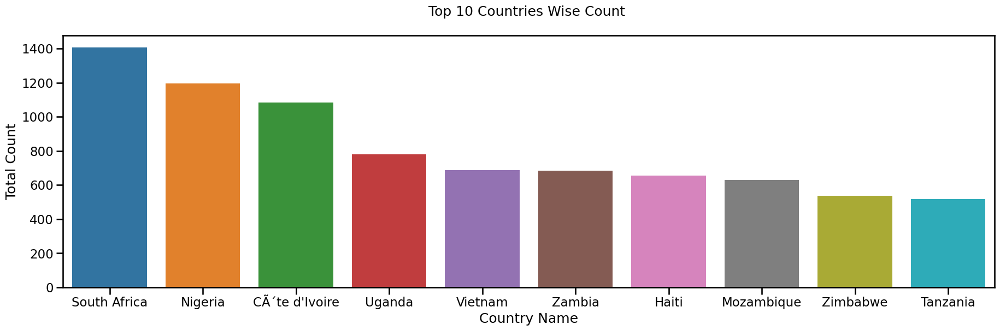

In [20]:
# Calculate the count of occurrences of each country and get the top 10 countries
ItemCount = df['country'].value_counts().nlargest(10)

# Print the top 10 countries and their counts
print("Top 10 Countries Wise Count \n")
print(ItemCount)

# Set the Seaborn context and font scale for better visualization aesthetics
sns.set_context("talk", font_scale=1)

# Create a new matplotlib figure with a specified size for the plot
plt.figure(figsize=(22, 6))

# Specify the order of the bars using the index of the top 10 countries from Step 1
sns.countplot(data=df, x='country', order=ItemCount.index)

# Set the title, x-axis label, and y-axis label for the plot
plt.title('Top 10 Countries Wise Count \n')
plt.ylabel('Total Count')
plt.xlabel('Country Name')

# Display the plot
plt.show()

In [21]:
print(type(df))

<class 'pandas.core.frame.DataFrame'>


In [22]:
import plotly.offline as py
import plotly.graph_objs as go

ShippingMode = df_new["shipment_mode"].value_counts()
labels = (np.array(ShippingMode.index))
sizes = (np.array((ShippingMode / ShippingMode.sum())*100))

trace = go.Pie(labels=labels, values=sizes)
layout = go.Layout(title="Shipment Mode")
dat = [trace]
fig = go.Figure(data=dat, layout=layout)
py.iplot(fig, filename="Shipment Mode")

manufacturing_site
Aurobindo Unit III, India         3172
Mylan (formerly Matrix) Nashik    1415
Hetero Unit III Hyderabad IN       869
Cipla, Goa, India                  665
Strides, Bangalore, India.         540
Alere Medical Co., Ltd.            481
Trinity Biotech, Plc               405
ABBVIE Ludwigshafen Germany        366
Inverness Japan                    345
ABBVIE (Abbott) Logis. UK          219
dtype: int64


Text(0.5, 0, 'Manufacturing Site Name')

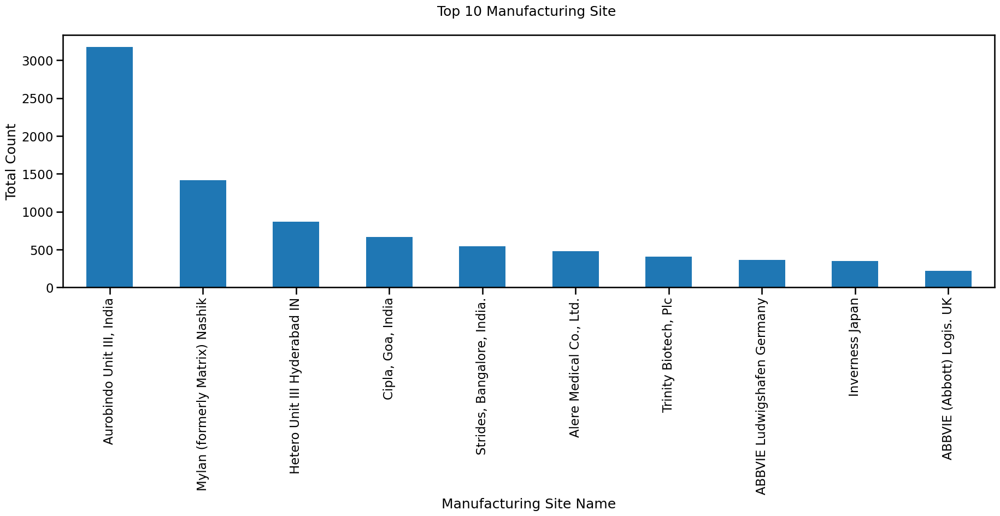

In [23]:
plt.figure(figsize=(22,6))
TopFiveManufacturingSite=df.groupby('manufacturing_site').size().nlargest(10)
print(TopFiveManufacturingSite)
TopFiveManufacturingSite.plot(kind='bar')
plt.title('Top 10 Manufacturing Site \n')
plt.ylabel('Total Count')
plt.xlabel('Manufacturing Site Name')

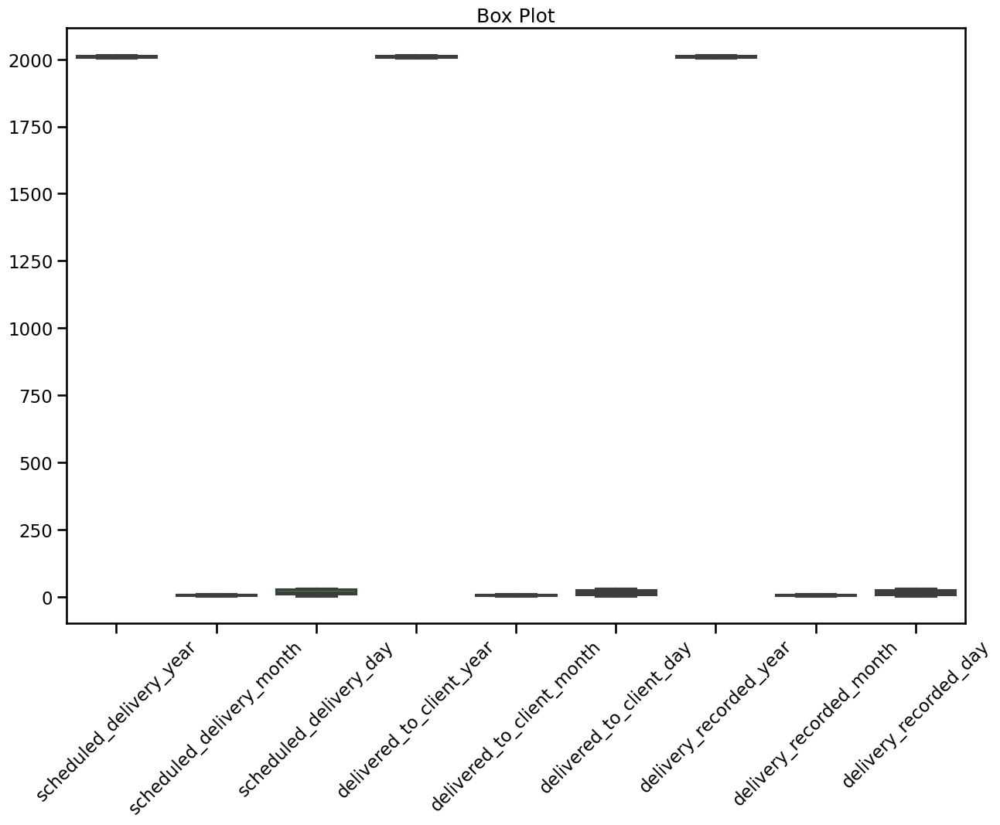

In [24]:
# Boxplot of the dataset
plt.figure(figsize=(15, 10))
sns.boxplot(data=df_new)
plt.title('Box Plot')
plt.xticks(rotation = 45) # Rotates X-Axis Ticks by 45-degrees
plt.show()

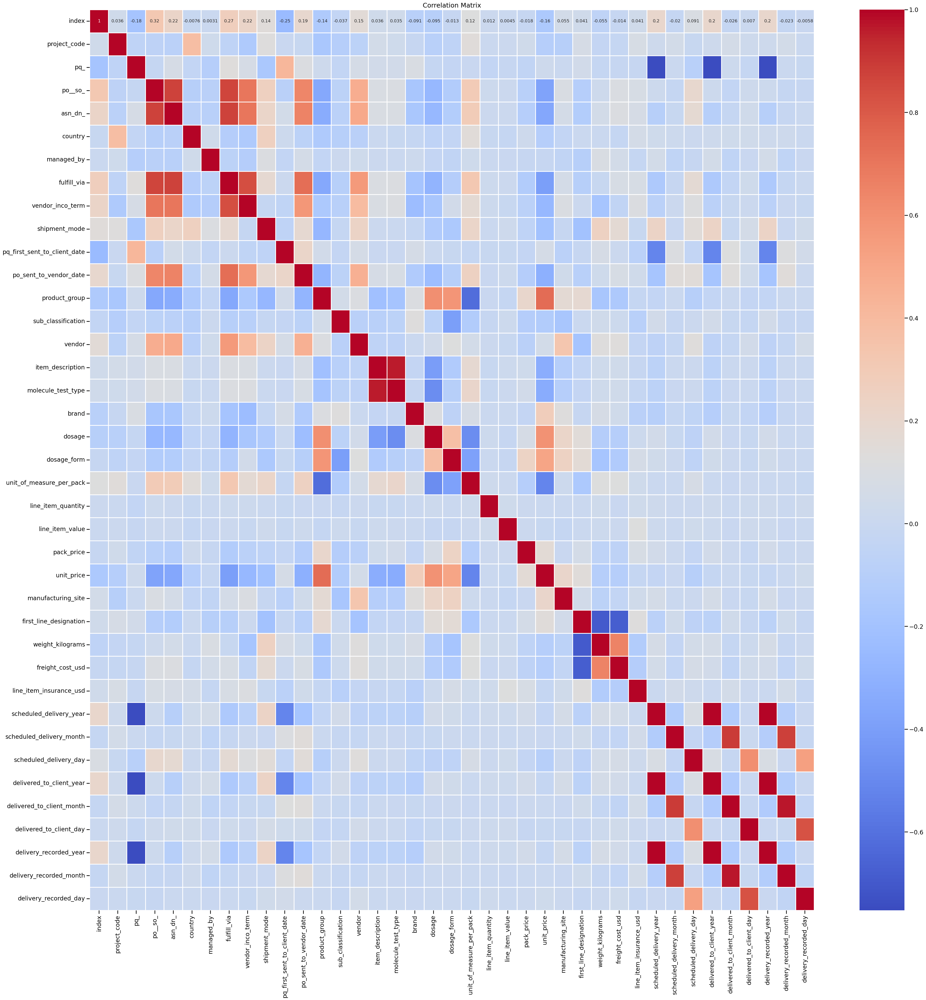

In [65]:
# Visualize the relationship between variables using a correlation matrix
%matplotlib inline

f, ax = plt.subplots(figsize=(45, 45))
corr_matrix = df_new.corr()
sns.heatmap(corr_matrix, annot=True, linewidths=2, cmap='coolwarm', annot_kws={"size": 12}, ax=ax)
plt.title('Correlation Matrix')
plt.show()

# **Neural Network Implementation**

In [26]:
label_encoder = LabelEncoder()
for col in df_new.columns:
    df_new[col] = label_encoder.fit_transform(df_new[col])

df_new.reset_index(inplace=True)

In [31]:
# Separate features and target variable
X = df_new.drop('shipment_mode', axis =1)
y = df_new['shipment_mode']

In [32]:
# Normalize node features
scaler = MinMaxScaler()
df_scaled = scaler.fit_transform(X)

In [33]:
# Converts the scaled dataset to dataframe
df_sc_df = pd.DataFrame(df_scaled, columns=X.columns)
df_sc_df.head()

,index,project_code,pq_,po__so_,asn_dn_,country,managed_by,fulfill_via,vendor_inco_term,pq_first_sent_to_client_date,...,line_item_insurance_usd,scheduled_delivery_year,scheduled_delivery_month,scheduled_delivery_day,delivered_to_client_year,delivered_to_client_month,delivered_to_client_day,delivery_recorded_year,delivery_recorded_month,delivery_recorded_day
0,0.000000,0.503546,0.055016,0.818517,0.805947,0.976190,0.666667,1.0,1.0,0.180628,...,0.128236,0.777778,0.454545,0.900000,0.777778,0.454545,0.200000,0.777778,0.454545,0.200000
1,0.000097,0.758865,0.072816,0.863286,0.806374,0.666667,0.666667,1.0,1.0,0.209424,...,0.989438,0.777778,0.363636,0.666667,0.777778,0.363636,0.933333,0.777778,0.363636,0.933333
2,0.000194,0.758865,0.072816,0.827664,0.806800,0.666667,0.666667,1.0,1.0,0.209424,...,0.730140,0.777778,0.363636,1.000000,0.777778,0.363636,0.900000,0.777778,0.363636,0.900000
3,0.000291,0.482270,0.148058,0.855424,0.808508,0.880952,0.666667,1.0,1.0,0.526178,...,0.086135,0.777778,0.636364,0.866667,0.777778,0.545455,0.766667,0.777778,0.545455,0.766667
4,0.000387,0.503546,0.119741,0.843870,0.808934,0.976190,0.666667,1.0,1.0,0.062827,...,0.102350,0.777778,0.818182,0.700000,0.777778,0.818182,0.700000,0.777778,0.909091,0.333333


In [34]:
feature_columns = []
for feature_name in X.columns:
    feature_columns.append(tf.feature_column.numeric_column(feature_name))

estimator = tf.estimator.DNNClassifier(
    feature_columns=feature_columns,
    hidden_units=[64, 32],
    n_classes=6,
    model_dir="estimator"
)

INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'estimator', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_session_creation_timeout_secs': 7200, '_checkpoint_save_graph_def': True, '_service': None, '_cluster_spec': ClusterSpec({}), '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}


In [35]:
# split dataset into training and validation dataset
X_train, X_test, y_train, y_test = train_test_split(df_sc_df, y, test_size=0.3, random_state=42)

In [36]:
# create input function
train_input_fn = tf.compat.v1.estimator.inputs.pandas_input_fn(
    x=X_train,
    y=y_train,
    batch_size=32,
    num_epochs=None,
    shuffle=True
)

estimator.train(input_fn=train_input_fn, steps=1000)

eval_input_fn = tf.compat.v1.estimator.inputs.pandas_input_fn(
    x=X_test,
    y=y_test,
    batch_size=32,
    num_epochs=1,
    shuffle=True
)



Instructions for updating:
Use Variable.read_value. Variables in 2.X are initialized automatically both in eager and graph (inside tf.defun) contexts.
Instructions for updating:
To construct input pipelines, use the `tf.data` module.
Instructions for updating:
To construct input pipelines, use the `tf.data` module.
INFO:tensorflow:Calling model_fn.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from estimator\model.ckpt-1000
Instructions for updating:
Use standard file utilities to get mtimes.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Instructions for updating:
To construct input pipelines, use the `tf.data` module.
INFO:tensorflow:Calling checkpoint listeners before saving checkpoint 1000...
INFO:tensorflow:Saving chec

In [37]:
from tensorflow.keras import models, layers

model = models.Sequential()
model.add(layers.Dense(64, activation='relu', input_shape=(X_train.shape[1],)))
model.add(layers.Dense(32, activation='relu'))
model.add(layers.Dense(10, activation='softmax'))

model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

history = model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=100, batch_size=32)

Epoch 1/100
226/226 [==============================] - 2s 5ms/step - loss: 1.1169 - accuracy: 0.6161 - val_loss: 0.8440 - val_accuracy: 0.6853
Epoch 2/100
226/226 [==============================] - 1s 4ms/step - loss: 0.7690 - accuracy: 0.7184 - val_loss: 0.7112 - val_accuracy: 0.7234
Epoch 3/100
226/226 [==============================] - 1s 4ms/step - loss: 0.6755 - accuracy: 0.7440 - val_loss: 0.6657 - val_accuracy: 0.7250
Epoch 4/100
226/226 [==============================] - 1s 4ms/step - loss: 0.6324 - accuracy: 0.7485 - val_loss: 0.6135 - val_accuracy: 0.7456
Epoch 5/100
226/226 [==============================] - 1s 4ms/step - loss: 0.5966 - accuracy: 0.7519 - val_loss: 0.5826 - val_accuracy: 0.7521
Epoch 6/100
226/226 [==============================] - 1s 4ms/step - loss: 0.5704 - accuracy: 0.7613 - val_loss: 0.5559 - val_accuracy: 0.7563
Epoch 7/100
226/226 [==============================] - 1s 4ms/step - loss: 0.5366 - accuracy: 0.7751 - val_loss: 0.5435 - val_accuracy: 0.7479

Epoch 58/100
226/226 [==============================] - 1s 4ms/step - loss: 0.2762 - accuracy: 0.8860 - val_loss: 0.3907 - val_accuracy: 0.8454
Epoch 59/100
226/226 [==============================] - 1s 4ms/step - loss: 0.2788 - accuracy: 0.8865 - val_loss: 0.3768 - val_accuracy: 0.8489
Epoch 60/100
226/226 [==============================] - 1s 4ms/step - loss: 0.2742 - accuracy: 0.8887 - val_loss: 0.3823 - val_accuracy: 0.8489
Epoch 61/100
226/226 [==============================] - 1s 4ms/step - loss: 0.2690 - accuracy: 0.8923 - val_loss: 0.3873 - val_accuracy: 0.8447
Epoch 62/100
226/226 [==============================] - 1s 5ms/step - loss: 0.2662 - accuracy: 0.8975 - val_loss: 0.3864 - val_accuracy: 0.8444
Epoch 63/100
226/226 [==============================] - 1s 5ms/step - loss: 0.2672 - accuracy: 0.8903 - val_loss: 0.3865 - val_accuracy: 0.8460
Epoch 64/100
226/226 [==============================] - 1s 4ms/step - loss: 0.2624 - accuracy: 0.8947 - val_loss: 0.3780 - val_accuracy:

In [38]:
# Evaluate the model
eval_metrics = estimator.evaluate(input_fn=eval_input_fn)
print("Validation set accuracy: {accuracy:0.3f}".format(**eval_metrics))

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2023-11-19T15:00:43
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from estimator\model.ckpt-2000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Inference Time : 1.25306s
INFO:tensorflow:Finished evaluation at 2023-11-19-15:00:45
INFO:tensorflow:Saving dict for global step 2000: accuracy = 0.58908975, average_loss = 1.0259541, global_step = 2000, loss = 1.0256094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2000: estimator\model.ckpt-2000
Validation set accuracy: 0.589


## **IMPLEMENTING MLJAR**

In [36]:
# Re-Check Linux Dependencies & Module 
#!pip install mljar-supervised

In [39]:
# scikit-learn utilites
from sklearn.datasets import load_digits
from sklearn.metrics import log_loss
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split

# mljar-supervised package
from supervised import AutoML


In [40]:
# scikit-learn utilites
from sklearn.datasets import make_classification #to create our own random data
from sklearn.model_selection import train_test_split #to split our own random data into train/test splits


In [41]:
# Create Dataset
X, y = make_classification(n_samples=10000, n_features=32, n_redundant=2)
print(X, "\n", "The Shape of X is: ", X.shape, "\n")
print(y, "\n", "The Shape of y is: ", y.shape, "\n")

[[ 0.69329259 -0.38973583  2.02407861 ...  1.35283162  0.32776181
  -0.23266687]
 [ 0.44238888  0.98725712 -0.47811038 ... -0.59008634  0.31889443
   1.01601755]
 [ 0.47274074 -0.28875191  0.01984694 ... -1.73053067 -1.15275577
   1.00087217]
 ...
 [-0.65705804 -0.55724578 -0.08418571 ...  0.81359278  1.49663855
  -0.39228056]
 [ 0.92304831  0.64839938 -1.54044332 ...  2.59489803  1.26186664
  -0.05726758]
 [-1.31340535  0.83712255  0.16110067 ...  1.44950292 -0.85714427
  -0.04551211]] 
 The Shape of X is:  (10000, 32) 

[0 0 1 ... 0 1 0] 
 The Shape of y is:  (10000,) 



In [42]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [43]:
# Create MLJAR model, defining algorithms
automl_2A = AutoML(mode = "Explain")

# Fit data into Model
automl_2A.fit(X_train, y_train)


AutoML directory: AutoML_2
The task is binary_classification with evaluation metric logloss
AutoML will use algorithms: ['Baseline', 'Linear', 'Decision Tree', 'Random Forest', 'Xgboost', 'Neural Network']
AutoML will ensemble available models
AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline logloss 0.693115 trained in 0.76 seconds
2_DecisionTree logloss 0.192126 trained in 37.34 seconds
3_Linear logloss 0.240328 trained in 12.34 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost logloss 0.124946 trained in 13.11 seconds
5_Default_NeuralNetwork logloss 0.20109 trained in 6.14 seconds
6_Default_RandomForest logloss 0.139535 trained in 31.79 seconds
* Step ensemble will try to check up to 1 model
Ensemble logloss 0.124264 trained in 5.44 seconds
AutoML fit time: 129.11 seconds
AutoML best model: Ensemble


AutoML()

In [44]:
# Summarize Performance of model
automl_2A.report()

Best model,name,model_type,metric_type,metric_value,train_time
,1_Baseline,Baseline,logloss,0.693115,2.71
,2_DecisionTree,Decision Tree,logloss,0.192126,41.12
,3_Linear,Linear,logloss,0.240328,14.63
,4_Default_Xgboost,Xgboost,logloss,0.124946,15.32
,5_Default_NeuralNetwork,Neural Network,logloss,0.20109,7.94
,6_Default_RandomForest,Random Forest,logloss,0.139535,33.97
the best,Ensemble,Ensemble,logloss,0.124264,5.44


In [46]:
predictions = automl_2A.predict_all(X_test)
predictions

,prediction_0,prediction_1,label
0,0.009231,0.990769,1
1,0.006023,0.993977,1
2,0.005758,0.994242,1
3,0.982579,0.017421,0
4,0.992745,0.007255,0
...,...,...,...
1995,0.007821,0.992179,1
1996,0.446449,0.553551,1
1997,0.030938,0.969062,1
1998,0.880185,0.119815,0


In [47]:
print("Test LogLoss", log_loss(y_test, predictions["prediction_1"]))

Test LogLoss 0.1348419787945661


In [48]:
print("Test LogLoss", log_loss(y_test, predictions["prediction_0"]))

Test LogLoss 3.743362506668449


## Learning Outcome

I discovered that the logistics and transportation industry has difficulty finding the most efficient delivery routes since they frequently rely on outdated techniques. The use of Graph Neural Networks (GNNs) to improve route optimisation is suggested as a potential option. To forecast the best routes while taking into account dynamic elements and real-time data, GNNs use graph topologies and convolutional layers. The GNN model can be trained and used in real-time systems to increase productivity and customer satisfaction. Despite being relatively new in this context, GNNs have the potential to help the industry solve its route optimisation problems.

## Future Scope :

Hybrid GNN Model : By utilizing the advantages of both approaches, i.e. , reinforcement learning and GNN this hybrid GNN-reinforcement learning system can handle challenging dynamic optimization problems. It provides the potential to respond to real-time changes, optimize for numerous goals, and make wise choices that increase the effectiveness of delivery routes and customer happiness.

## Remarks

It was a rewarding experience to witness our models perform well during testing and achieve the desired route optimization goals. This project highlighted the significance of comprehensive model assessment. I am proud of the model's ability to capture complex relationships in the data.